<h1 style="text-align: center;"><a href="https://www.whatwouldaithink.com">WhatWouldAiThink.com</a></h1>


<h3 style="text-align: center;">Classification of Cats and Dogs</h3>

<h3 style="text-align: center;">April 2024</h3>

<h3 style="text-align: center;">This notebook is made for the analysis of cats and dogs published on:
<a href="https://www.whatwouldaithink.com">whatwouldaithink.com</a></h3>
<h4 style="text-align: center;">Copyright © 2022-Present whatwouldaithink.com - All Rights Reserved</h4>

<h1 style="text-align: center;"> Train a CNN with grayscale images </h1>

In [1]:
# import basics
import os
from pathlib import Path
import time

# import torch
import torch
from random import randrange
torch.manual_seed(0)
# custom modules
import sys
sys.path.append('..')
from printing.customPrinting import info
from vision.Definitions import *
from vision.Utils import printNumOfLearnableWeights
from vision.Utils import readDataToDataFrame, createDirectories
from vision.TransformImages import TransformImages
from vision.Data import Data
from vision.Models import CNN
from vision.ValidationTools import MyValidator, ValidatePretrainedModel
from vision.TrainModels import TrainingManager
# MIN_SIZE_IMAGE is 224, defined in vision.Definitions

pathDataSet = "datasets"
pathDataSetGrayScale = f"{pathDataSet}_gray"

import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option("display.max_colwidth", 200)
pd.set_option("display.max_columns", 10)

<h1>1. Convert all images to grayscale</h1>

In [2]:
# "training_set" and "test_set" are from https://www.kaggle.com/datasets/charmz/cats-and-dogs
# "validate_set" and "validate_set_cropped" are from https://github.com/WhatWouldAiThink/About_Cats_in_Montenegro

# Create a new directory with subfolders to convert all images into grayscale
folders = ["training_set", 
           "test_set", 
           "validate_set", 
           "validate_set_cropped"]           
                     
# transform the images and save it in the new directory             
if createDirectories(pathDataSetGrayScale, folders):    
    transformer = TransformImages(os.path.join(pathDataSet), 
                                  os.path.join(pathDataSetGrayScale))

    tic = time.time()    
    # convert to grayscale
    print(f"Convert images to grayscale")
    transformer.toGrayScale()
    print(f"Used time: {time.time() - tic}")    

# redefine the paths to use only gray scale images
pathDataSet = pathDataSetGrayScale
pathDataSet224x224 = f"{pathDataSetGrayScale}{MIN_SIZE_IMAGE[0]}x{MIN_SIZE_IMAGE[1]}"

created directory: datasets_gray/training_set/cats
created directory: datasets_gray/training_set/dogs
created directory: datasets_gray/test_set/cats
created directory: datasets_gray/test_set/dogs
created directory: datasets_gray/validate_set/cats
created directory: datasets_gray/validate_set/dogs
created directory: datasets_gray/validate_set_cropped/cats
created directory: datasets_gray/validate_set_cropped/dogs
Convert images to grayscale
Used time: 92.35020732879639


<h1>2. Check and preprocess the data</h1>

### Create the DataFrames

In [3]:
df_train = readDataToDataFrame(os.path.join(pathDataSet, "training_set"))
df_test = readDataToDataFrame(os.path.join(pathDataSet, "test_set"))
df_validate = readDataToDataFrame(os.path.join(pathDataSet, "validate_set"))
df_validateCropped = readDataToDataFrame(os.path.join(pathDataSet, "validate_set_cropped"))

Reading files from folder: datasets_gray/training_set/cats
Reading files from folder: datasets_gray/training_set/dogs
Reading files from folder: datasets_gray/test_set/cats
Reading files from folder: datasets_gray/test_set/dogs
Reading files from folder: datasets_gray/validate_set/cats
Reading files from folder: datasets_gray/validate_set_cropped/cats


### Create the DataSets

In [4]:
dataSetTrain = Data(df_train)
dataSetTest = Data(df_test)
dataSetValidate = Data(df_validate)
dataSetValidateCropped = Data(df_validateCropped)

### Plot images for all DataSets to check that all images are grayscale images

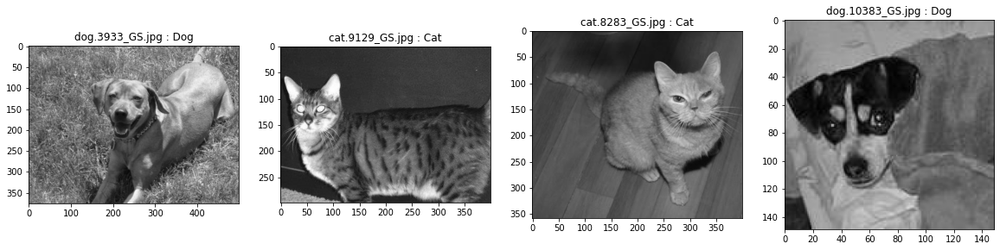

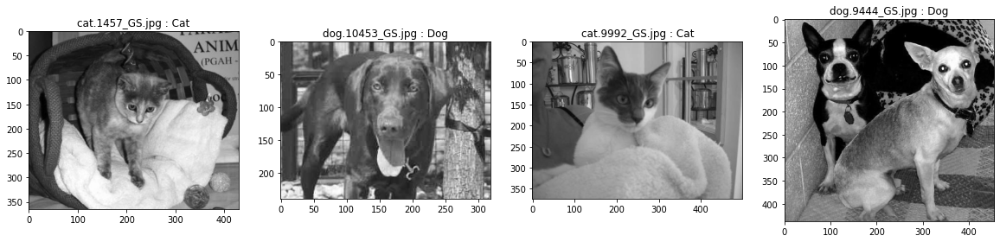

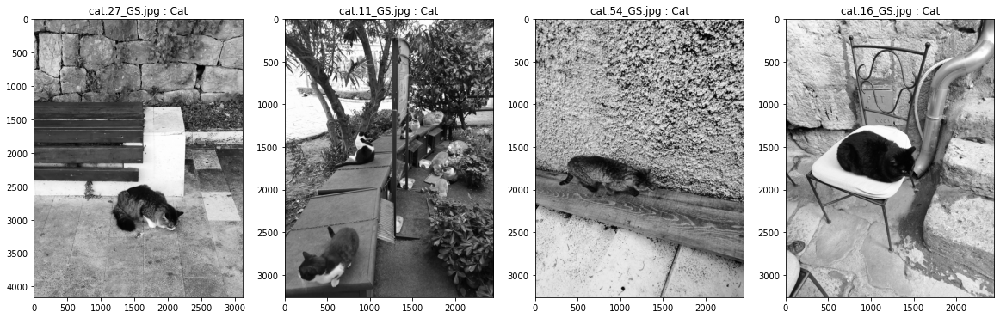

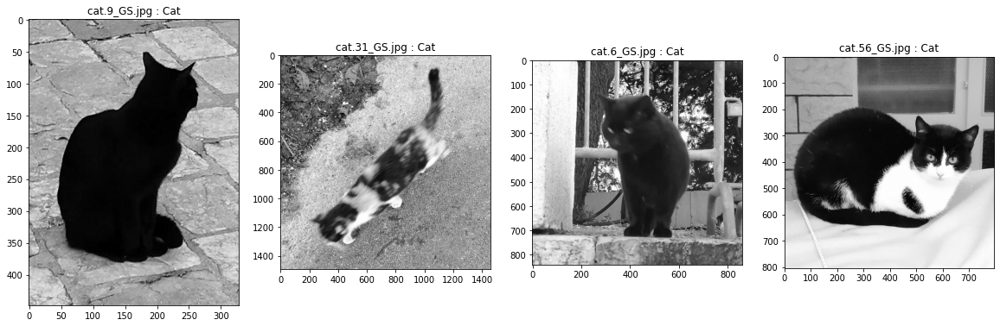

In [5]:
for dataSet in [dataSetTrain, dataSetTest, dataSetValidate, dataSetValidateCropped]:
    numImages = 4
    dataSet.plotImages([randrange(0, dataSet.__len__()) for _ in range(numImages)])    

<h1>3. Fliter the data for training a CNN </h1>

### Create a new directory and resize the images to MIN_SIZE_IMAGE

In [6]:
# create a new directory with subfolders for images with size MIN_SIZE_IMAGE
folders = ["training_set", 
           "test_set", 
           "validate_set", 
           "validate_set_cropped"]
    
# resize the images and save it in the new directory             
if createDirectories(pathDataSet224x224, folders):
    print(f"Resizing images")
    transformer = TransformImages(pathDataSet, 
                                  pathDataSet224x224, 
                                  resize=True, 
                                  size=MIN_SIZE_IMAGE)
    transformer.resize() 

created directory: datasets_gray224x224/training_set/cats
created directory: datasets_gray224x224/training_set/dogs
created directory: datasets_gray224x224/test_set/cats
created directory: datasets_gray224x224/test_set/dogs
created directory: datasets_gray224x224/validate_set/cats
created directory: datasets_gray224x224/validate_set/dogs
created directory: datasets_gray224x224/validate_set_cropped/cats
created directory: datasets_gray224x224/validate_set_cropped/dogs
Resizing images


### Create new dataframes with equal image size MIN_SIZE_IMAGE

In [7]:
df_train    = readDataToDataFrame(os.path.join(pathDataSet224x224, "training_set"))
df_test     = readDataToDataFrame(os.path.join(pathDataSet224x224, "test_set"))
df_validate = readDataToDataFrame(os.path.join(pathDataSet224x224, "validate_set"))
df_validateCropped = readDataToDataFrame(os.path.join(pathDataSet224x224, "validate_set_cropped"))

Reading files from folder: datasets_gray224x224/training_set/cats
Reading files from folder: datasets_gray224x224/training_set/dogs
Reading files from folder: datasets_gray224x224/test_set/cats
Reading files from folder: datasets_gray224x224/test_set/dogs
Reading files from folder: datasets_gray224x224/validate_set/cats
Reading files from folder: datasets_gray224x224/validate_set_cropped/cats


### Check the new DataFrames and basic statistics. We see that all images have equal size of 224x224 pixel.

In [8]:
df_train.describe()

,label,width,height
count,17650.000000,17650.0,17650.0
mean,0.499150,224.0,224.0
std,0.500013,0.0,0.0
min,0.000000,224.0,224.0
25%,0.000000,224.0,224.0
50%,0.000000,224.0,224.0
75%,1.000000,224.0,224.0
max,1.000000,224.0,224.0


In [9]:
df_test.describe()

,label,width,height
count,4395.000000,4395.0,4395.0
mean,0.500114,224.0,224.0
std,0.500057,0.0,0.0
min,0.000000,224.0,224.0
25%,0.000000,224.0,224.0
50%,1.000000,224.0,224.0
75%,1.000000,224.0,224.0
max,1.000000,224.0,224.0


In [10]:
df_validate.describe()

,label,width,height
count,61.0,61.0,61.0
mean,1.0,224.0,224.0
std,0.0,0.0,0.0
min,1.0,224.0,224.0
25%,1.0,224.0,224.0
50%,1.0,224.0,224.0
75%,1.0,224.0,224.0
max,1.0,224.0,224.0


In [11]:
df_validateCropped.describe()

,label,width,height
count,61.0,61.0,61.0
mean,1.0,224.0,224.0
std,0.0,0.0,0.0
min,1.0,224.0,224.0
25%,1.0,224.0,224.0
50%,1.0,224.0,224.0
75%,1.0,224.0,224.0
max,1.0,224.0,224.0


### Create new DataSets with equal image size MIN_SIZE_IMAGE

In [12]:
dataSetTrain = Data(df_train)
dataSetTest = Data(df_test)
dataSetValidate = Data(df_validate)
dataSetValidateCropped = Data(df_validateCropped)

### Print some images and their histogram

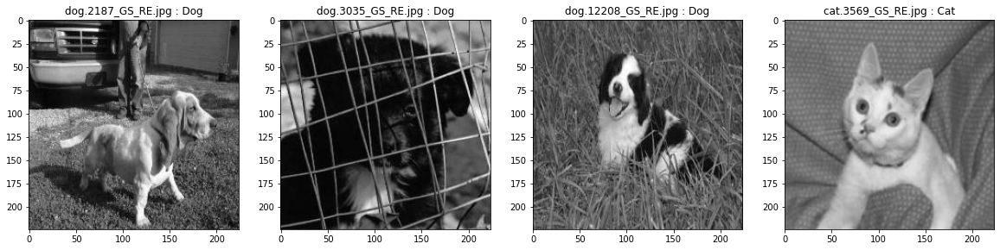

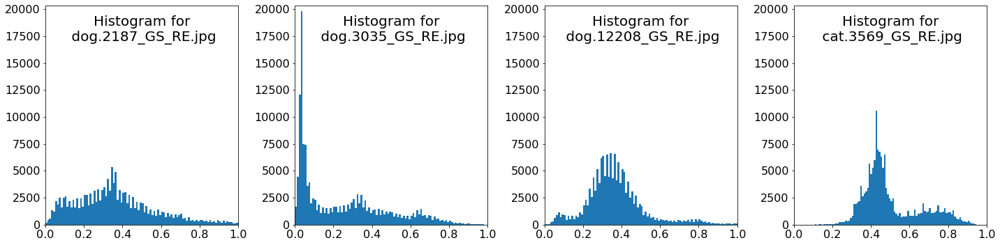

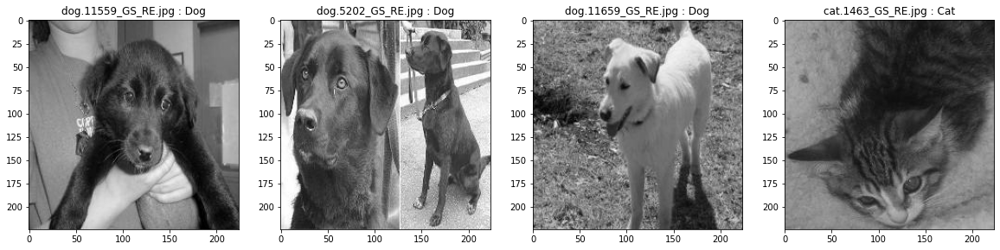

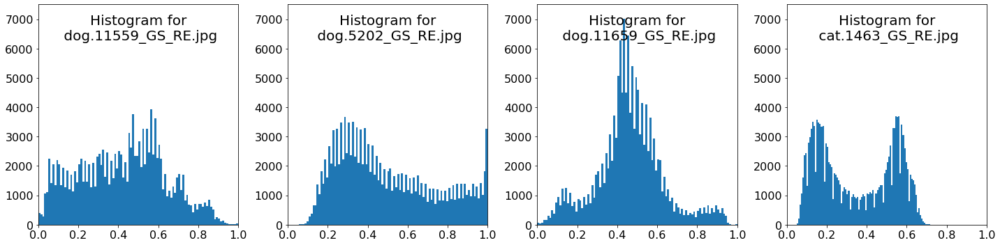

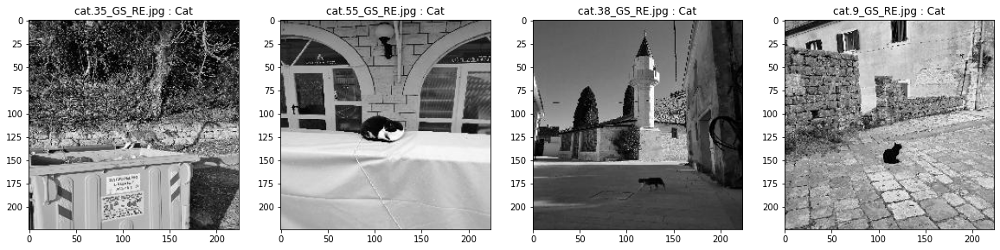

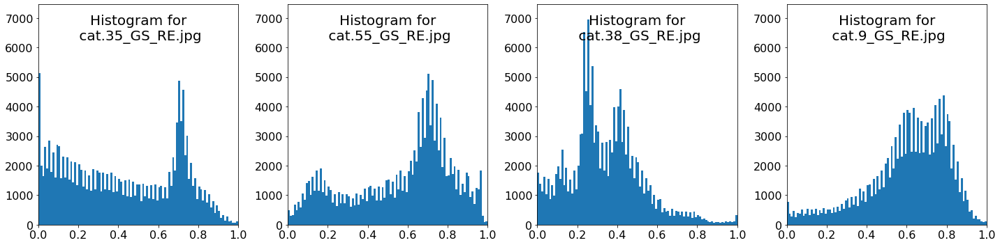

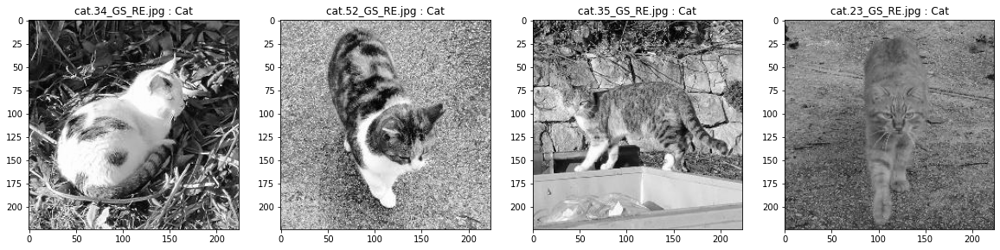

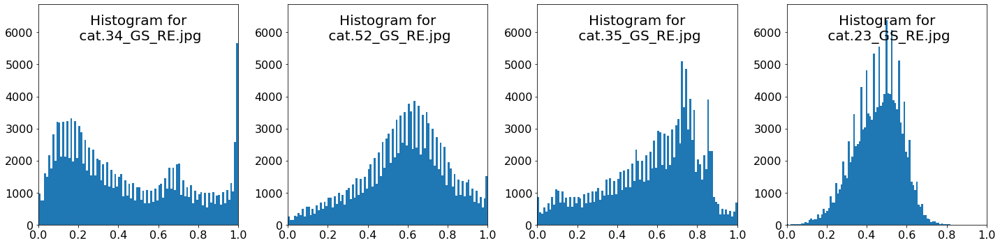

In [13]:
for dataSet in [dataSetTrain, dataSetTest, dataSetValidate, dataSetValidateCropped]:
    numImages = 4
    # create a list to plot the histogram for the respective image
    listImages = [randrange(0, dataSet.__len__()) for _ in range(numImages)]
    dataSet.plotImages(listImages)
    dataSet.plotHistogram(listImages)

<h1>4. Train a CNN with grayscale images </h1>

In [14]:
# define the params for the convolution layers
conv1 = {"inChannels" : 3, "outChannels" : 32,
         "cKernel" : 5, "cStride" : 1, "cPadding" : 2}
conv2 = {"inChannels" : 32, "outChannels" : 64,
         "cKernel" : 5, "cStride" : 1, "cPadding" : 2}
conv3 = {"inChannels" : 64, "outChannels" : 128,
         "cKernel" : 5, "cStride" : 1, "cPadding" : 2}
conv4 = {"inChannels" : 128, "outChannels" : 256,
         "cKernel" : 5, "cStride" : 1, "cPadding" : 2}
conv5 = {"inChannels" : 256, "outChannels" : 512,
         "cKernel" : 5, "cStride" : 1, "cPadding" : 2}
    
# create the model    
model = CNN(imageSize=MIN_SIZE_IMAGE,
              convLayers=[conv1, conv2, conv3, conv4, conv5], 
              fullConLayers=[1],              
              dropOut=0.5)

printNumOfLearnableWeights(model)
display(model)

Creating a CNN with the following architecture:

Convolution Layer: 0
Channels in: 3
Channels out: 32
Reading default parameters for max pooling
Size Image out Conv: (224, 224)
Size Image out MaxPool: (112, 112)

Convolution Layer: 1
Channels in: 32
Channels out: 64
Reading default parameters for max pooling
Size Image out Conv: (112, 112)
Size Image out MaxPool: (56, 56)

Convolution Layer: 2
Channels in: 64
Channels out: 128
Reading default parameters for max pooling
Size Image out Conv: (56, 56)
Size Image out MaxPool: (28, 28)

Convolution Layer: 3
Channels in: 128
Channels out: 256
Reading default parameters for max pooling
Size Image out Conv: (28, 28)
Size Image out MaxPool: (14, 14)

Convolution Layer: 4
Channels in: 256
Channels out: 512
Reading default parameters for max pooling
Size Image out Conv: (14, 14)
Size Image out MaxPool: (7, 7)

Fully connected layer: 0
Number of Neurons: 1

Setting criterion to BinaryCrossEntropyLoss!
Number of trainable weights: 4382467


CNN(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14)

In [15]:
# create the model    
model = CNN(imageSize=MIN_SIZE_IMAGE,
              convLayers=[conv1, conv2, conv3, conv4, conv5], 
              fullConLayers=[1],              
              dropOut=0.5)

printNumOfLearnableWeights(model)
display(model)

Creating a CNN with the following architecture:

Convolution Layer: 0
Channels in: 3
Channels out: 32
Reading default parameters for max pooling
Size Image out Conv: (224, 224)
Size Image out MaxPool: (112, 112)

Convolution Layer: 1
Channels in: 32
Channels out: 64
Reading default parameters for max pooling
Size Image out Conv: (112, 112)
Size Image out MaxPool: (56, 56)

Convolution Layer: 2
Channels in: 64
Channels out: 128
Reading default parameters for max pooling
Size Image out Conv: (56, 56)
Size Image out MaxPool: (28, 28)

Convolution Layer: 3
Channels in: 128
Channels out: 256
Reading default parameters for max pooling
Size Image out Conv: (28, 28)
Size Image out MaxPool: (14, 14)

Convolution Layer: 4
Channels in: 256
Channels out: 512
Reading default parameters for max pooling
Size Image out Conv: (14, 14)
Size Image out MaxPool: (7, 7)

Fully connected layer: 0
Number of Neurons: 1

Setting criterion to BinaryCrossEntropyLoss!
Number of trainable weights: 4382467


CNN(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14)

Number of samples for train: 17650
Number of samples for test: 4395
Number of samples for vali: 61
Number of samples for valiCrop: 61

File checkpoint_GrayScaleImages.pt or checkpoint_GrayScaleImages_best.pt already exist.
ONLY RESUME TRAINING POSSIBLE!!!.


Loading checkpoint: checkpoint_GrayScaleImages.pt
checkpoint[epoch]: 50

Loading checkpoint['accuracy_lists']
valiCrop : [0.19672131147540983, 0.36065573770491804, 0.4098360655737705, 0.5245901639344263, 0.26229508196721313, 0.2786885245901639, 0.2786885245901639, 0.2459016393442623, 0.7704918032786885, 0.4918032786885246, 0.2786885245901639, 0.2786885245901639, 0.32786885245901637, 0.47540983606557374, 0.4426229508196721, 0.39344262295081966, 0.4098360655737705, 0.29508196721311475, 0.6065573770491803, 0.2459016393442623, 0.45901639344262296, 0.4918032786885246, 0.4098360655737705, 0.45901639344262296, 0.32786885245901637, 0.5409836065573771, 0.2459016393442623, 0.36065573770491804, 0.4918032786885246, 0.26229508196721313, 0.42622

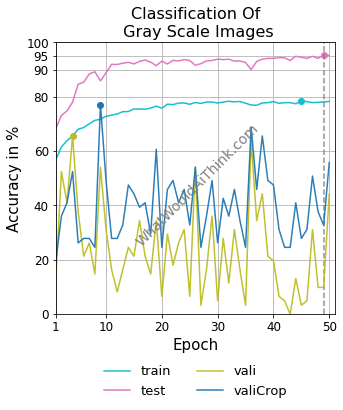

In [16]:
# Train the model
checkpoint="GrayScaleImages"
tm = TrainingManager(lr=0.001, model=model, nameCheckpoint=checkpoint, 
                     batchSize=32, criterion=model.criterion, 
                     datasets={"train": dataSetTrain, 
                      "test": dataSetTest,
                      "vali": dataSetValidate,
                      "valiCrop": dataSetValidateCropped},
                      title="Classification Of\n Gray Scale Images")

n_epochs = 0
tm.resume(n_epochs)

### Test the trained CNN with the test set


Loading checkpoint: checkpoint_GrayScaleImages_best.pt
Found    4189    true classified images in 4395 images.
Found    206     false classified images in 4395 images.

Confusion Matrix: [[2094  103]
 [ 103 2095]]
Found    2094    images classified as trueDog    in 4395 images.
Found    103     images classified as falseCat   in 4395 images.
Found    103     images classified as falseDog   in 4395 images.
Found    2095    images classified as trueCat    in 4395 images.


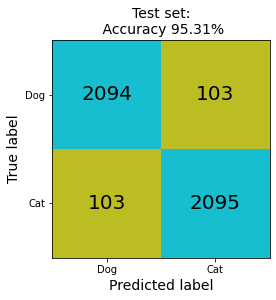

In [17]:
checkPointBest = f"checkpoint_{checkpoint}_best.pt"
validator = MyValidator(model, checkPointBest, dataSetTest, labelDic, "Test set")
validator.plotConfusionMatrix("Test set", f"CMatrixTestSetResults{checkpoint}")

### Validate the trained CNN with the validation sets


Loading checkpoint: checkpoint_GrayScaleImages_best.pt
Found     6      true classified images in 61 images.
Found     55     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [55  6]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     55     images classified as falseDog   in 61 images.
Found     6      images classified as trueCat    in 61 images.


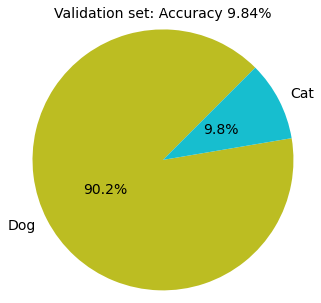

In [18]:
validator = MyValidator(model, checkPointBest, dataSetValidate, labelDic, "Validation set")
validator.plotPie("Validation set", f"PieChartValiSetResults{checkpoint}")


Loading checkpoint: checkpoint_GrayScaleImages_best.pt
Found     20     true classified images in 61 images.
Found     41     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [41 20]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     41     images classified as falseDog   in 61 images.
Found     20     images classified as trueCat    in 61 images.


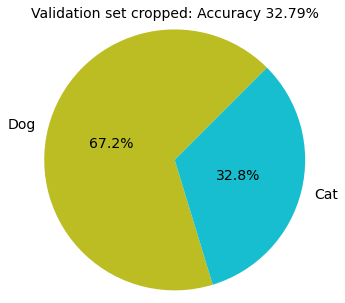

In [19]:
validator = MyValidator(model, checkPointBest, dataSetValidateCropped, labelDic, "Validation set cropped")
validator.plotPie("Validation set cropped", f"PieChartValiSetCroppedResults{checkpoint}")

### Plot some false and true classified images

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


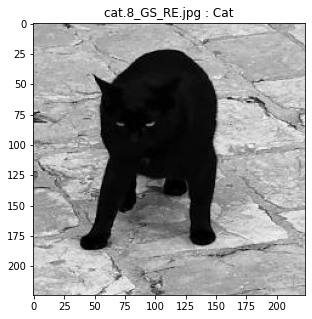

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


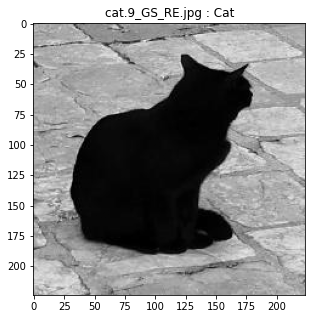

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


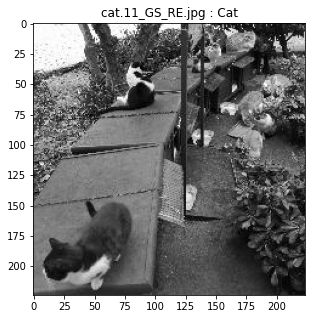

In [20]:
validator.plotClassifiedImages("False", 3)

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


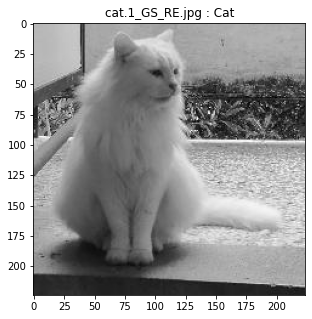

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


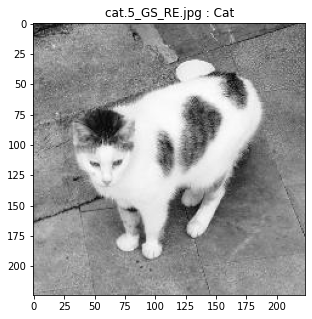

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


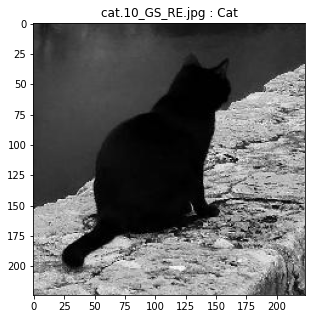

In [21]:
validator.plotClassifiedImages("True", 3)

<h1>5. Equalize the Histogram of all images </h1>

### Equalize the Histogram of all images in the training, test and validation sets

In [22]:
# create a new directory with subfolders for equalized images
folders = ["training_set", 
           "test_set", 
           "validate_set", 
           "validate_set_cropped"]             
pathDataSetEqualized224x224 = f"{pathDataSet}_equalized{MIN_SIZE_IMAGE[0]}x{MIN_SIZE_IMAGE[1]}"

# transform the images and save it in the new directory
if createDirectories(pathDataSetEqualized224x224, folders):
    transformer = TransformImages(os.path.join(pathDataSet224x224), 
                                  os.path.join(pathDataSetEqualized224x224))

    tic = time.time()
    # equalize the histogram
    transformer.equalize()    
    print(f"Used time: {time.time() - tic}")

created directory: datasets_gray_equalized224x224/training_set/cats
created directory: datasets_gray_equalized224x224/training_set/dogs
created directory: datasets_gray_equalized224x224/test_set/cats
created directory: datasets_gray_equalized224x224/test_set/dogs
created directory: datasets_gray_equalized224x224/validate_set/cats
created directory: datasets_gray_equalized224x224/validate_set/dogs
created directory: datasets_gray_equalized224x224/validate_set_cropped/cats
created directory: datasets_gray_equalized224x224/validate_set_cropped/dogs
Used time: 56.339807748794556


<h1>6. Train the CNN with equalized training Images </h1>

### Now use the equalized training images for training

In [23]:
# update only the dataframe for training images with equalized images
df_train = readDataToDataFrame(os.path.join(pathDataSetEqualized224x224, "training_set"))
# update only the dataSet for training images with equalized images
dataSetTrain = Data(df_train)

Reading files from folder: datasets_gray_equalized224x224/training_set/cats
Reading files from folder: datasets_gray_equalized224x224/training_set/dogs


### Plot images  and histograms for all DataSets to check that only the training images are equalized

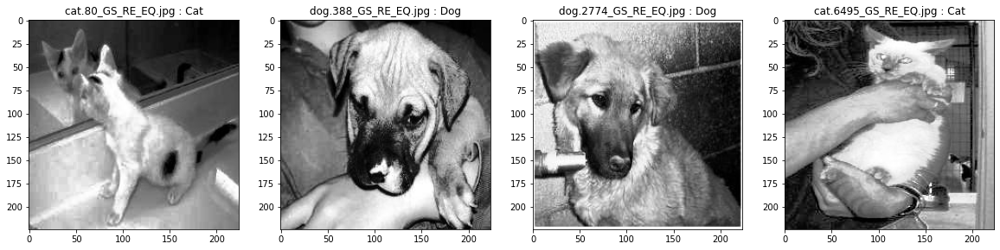

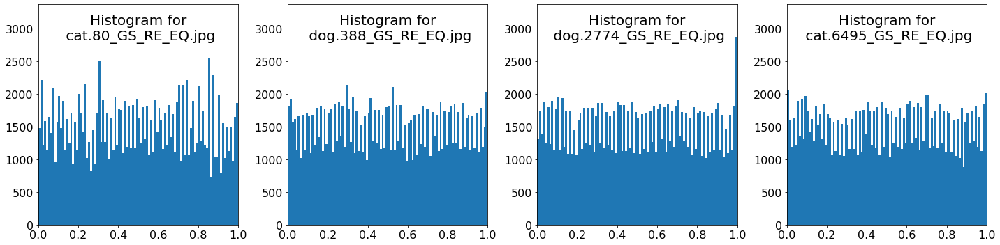

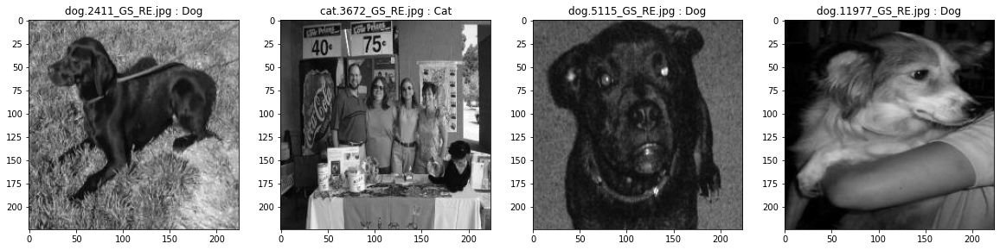

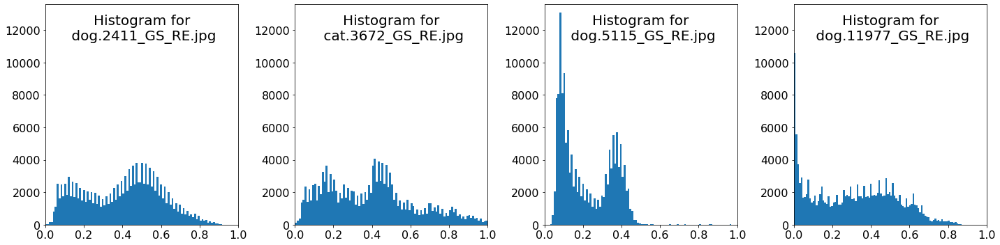

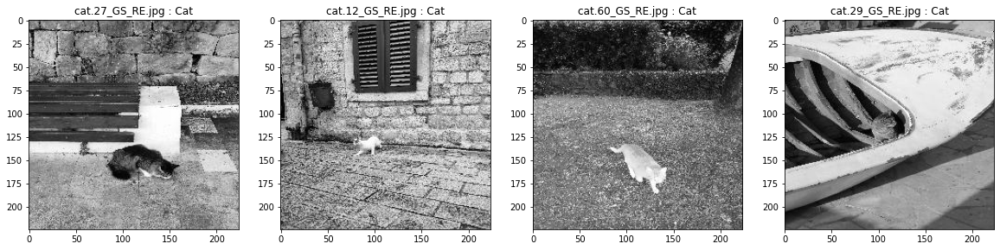

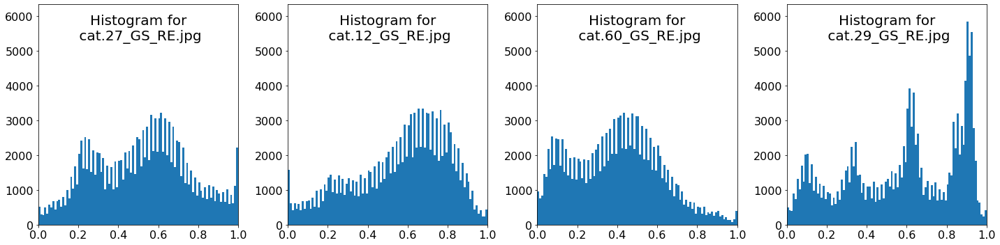

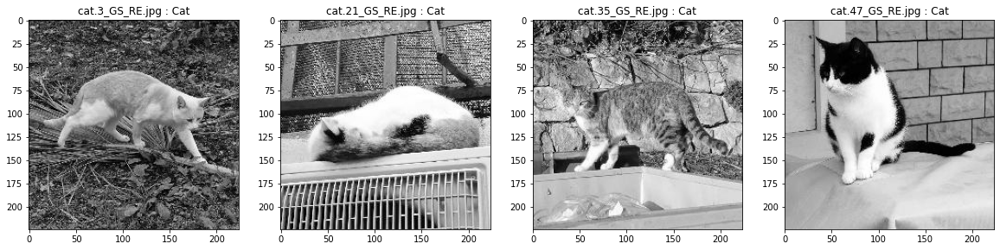

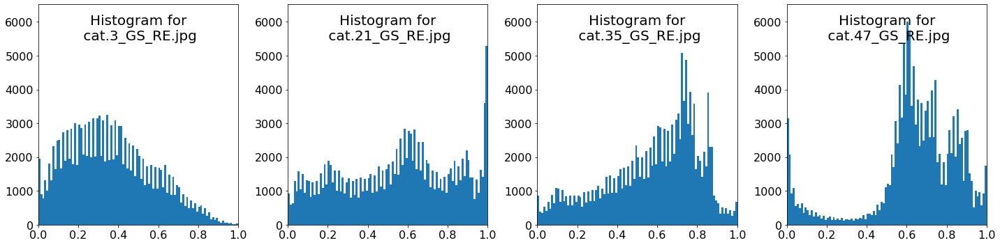

In [24]:
for dataSet in [dataSetTrain, dataSetTest, dataSetValidate, dataSetValidateCropped]:
    numImages = 4
    listImages = [randrange(0, dataSet.__len__()) for _ in range(numImages)]
    dataSet.plotImages(listImages)
    dataSet.plotHistogram(listImages)

In [25]:
# use the same conv layers and create the model
model = CNN(imageSize=MIN_SIZE_IMAGE,
              convLayers=[conv1, conv2, conv3, conv4, conv5], 
              fullConLayers=[1],              
              dropOut=0.5)
display(model)

Creating a CNN with the following architecture:

Convolution Layer: 0
Channels in: 3
Channels out: 32
Reading default parameters for max pooling
Size Image out Conv: (224, 224)
Size Image out MaxPool: (112, 112)

Convolution Layer: 1
Channels in: 32
Channels out: 64
Reading default parameters for max pooling
Size Image out Conv: (112, 112)
Size Image out MaxPool: (56, 56)

Convolution Layer: 2
Channels in: 64
Channels out: 128
Reading default parameters for max pooling
Size Image out Conv: (56, 56)
Size Image out MaxPool: (28, 28)

Convolution Layer: 3
Channels in: 128
Channels out: 256
Reading default parameters for max pooling
Size Image out Conv: (28, 28)
Size Image out MaxPool: (14, 14)

Convolution Layer: 4
Channels in: 256
Channels out: 512
Reading default parameters for max pooling
Size Image out Conv: (14, 14)
Size Image out MaxPool: (7, 7)

Fully connected layer: 0
Number of Neurons: 1

Setting criterion to BinaryCrossEntropyLoss!


CNN(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14)

Number of samples for train: 17650
Number of samples for test: 4395
Number of samples for vali: 61
Number of samples for valiCrop: 61

File checkpoint_GrayScaleImages_TrainingData_Equalized.pt or checkpoint_GrayScaleImages_TrainingData_Equalized_best.pt already exist.
ONLY RESUME TRAINING POSSIBLE!!!.


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized.pt
checkpoint[epoch]: 50

Loading checkpoint['accuracy_lists']
valiCrop : [0.4262295081967213, 0.16393442622950818, 0.3114754098360656, 0.22950819672131148, 0.36065573770491804, 0.4098360655737705, 0.3770491803278688, 0.3770491803278688, 0.7049180327868853, 0.39344262295081966, 0.3442622950819672, 0.5737704918032787, 0.3770491803278688, 0.5409836065573771, 0.639344262295082, 0.6229508196721312, 0.3114754098360656, 0.3114754098360656, 0.5409836065573771, 0.4262295081967213, 0.2786885245901639, 0.3770491803278688, 0.6229508196721312, 0.45901639344262296, 0.5081967213114754, 0.639344262295082, 0.5081967213114754, 0.37704

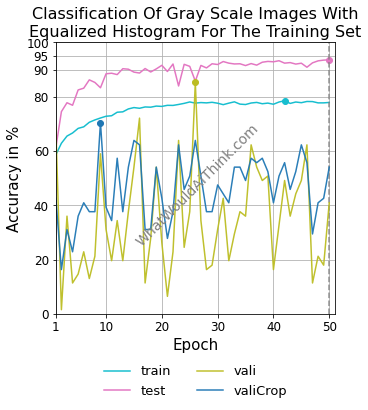

In [26]:
# Train the model
checkpoint="GrayScaleImages_TrainingData_Equalized"
tm = TrainingManager(lr=0.001, model=model, nameCheckpoint=checkpoint, 
                     batchSize=32, criterion=model.criterion,                     
                     datasets={"train": dataSetTrain, 
                      "test": dataSetTest,
                      "vali": dataSetValidate,
                      "valiCrop": dataSetValidateCropped},
                      title="Classification Of Gray Scale Images With\nEqualized Histogram For The Training Set")
n_epochs = 0
tm.resume(n_epochs)

### Test the trained CNN with the test set


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_best.pt
Found    4113    true classified images in 4395 images.
Found    282     false classified images in 4395 images.

Confusion Matrix: [[1983  214]
 [  68 2130]]
Found    1983    images classified as trueDog    in 4395 images.
Found    214     images classified as falseCat   in 4395 images.
Found     68     images classified as falseDog   in 4395 images.
Found    2130    images classified as trueCat    in 4395 images.


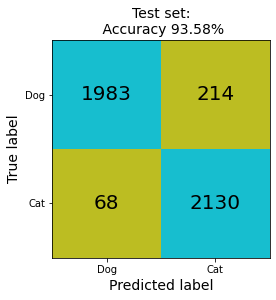

In [27]:
checkPointBest = f"checkpoint_{checkpoint}_best.pt"
validator = MyValidator(model, checkPointBest, dataSetTest, labelDic, "Test set")
validator.plotConfusionMatrix("Test set", f"CMatrixTestSetResults{checkpoint}")

### Validate the trained CNN with the validation sets


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_best.pt
Found     25     true classified images in 61 images.
Found     36     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [36 25]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     36     images classified as falseDog   in 61 images.
Found     25     images classified as trueCat    in 61 images.


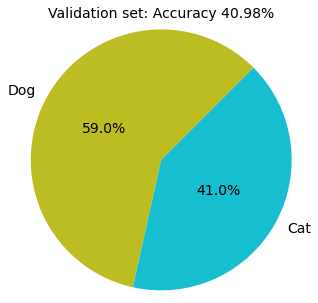

In [28]:
validator = MyValidator(model, checkPointBest, dataSetValidate, labelDic, "Validation set")
validator.plotPie("Validation set", f"PieChartValiSetResults{checkpoint}")


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_best.pt
Found     33     true classified images in 61 images.
Found     28     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [28 33]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     28     images classified as falseDog   in 61 images.
Found     33     images classified as trueCat    in 61 images.


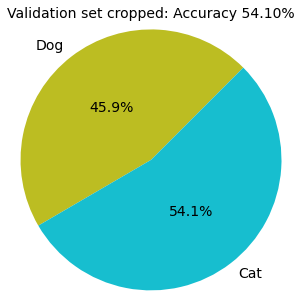

In [29]:
validator = MyValidator(model, checkPointBest, dataSetValidateCropped, labelDic, "Validation set cropped")
validator.plotPie("Validation set cropped", f"PieChartValiSetCroppedResults{checkpoint}")

### Plot some false and true classified images

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


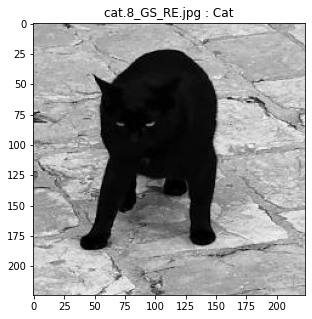

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


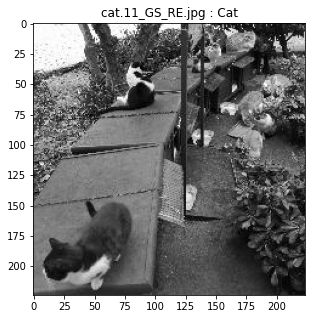

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


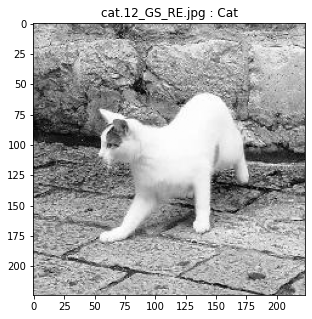

In [30]:
validator.plotClassifiedImages("False", 3)

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


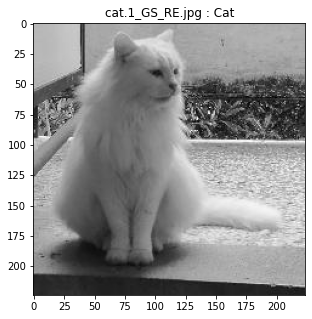

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


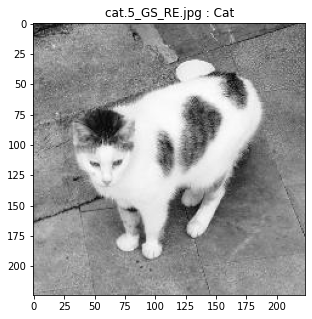

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


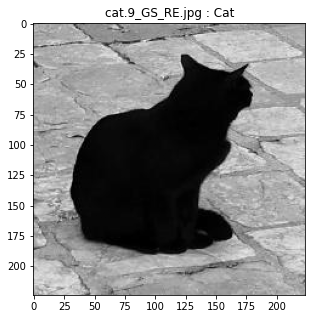

In [31]:
validator.plotClassifiedImages("True", 3)

<h1>7. Train the CNN with equalized training, test and validation images </h1>

### Now update all DataFrames and DataSets with equalized images

In [32]:
df_train = readDataToDataFrame(os.path.join(pathDataSetEqualized224x224, "training_set"))
df_test = readDataToDataFrame(os.path.join(pathDataSetEqualized224x224, "test_set"))
df_validate = readDataToDataFrame(os.path.join(pathDataSetEqualized224x224, "validate_set"))
df_validateCropped = readDataToDataFrame(os.path.join(pathDataSetEqualized224x224, "validate_set_cropped"))

dataSetTrain = Data(df_train)
dataSetTest = Data(df_test)
dataSetValidate = Data(df_validate)
dataSetValidateCropped = Data(df_validateCropped)

Reading files from folder: datasets_gray_equalized224x224/training_set/cats
Reading files from folder: datasets_gray_equalized224x224/training_set/dogs
Reading files from folder: datasets_gray_equalized224x224/test_set/cats
Reading files from folder: datasets_gray_equalized224x224/test_set/dogs
Reading files from folder: datasets_gray_equalized224x224/validate_set/cats
Reading files from folder: datasets_gray_equalized224x224/validate_set_cropped/cats


### Plot images and histograms for all DataSets to check that all images are equalized

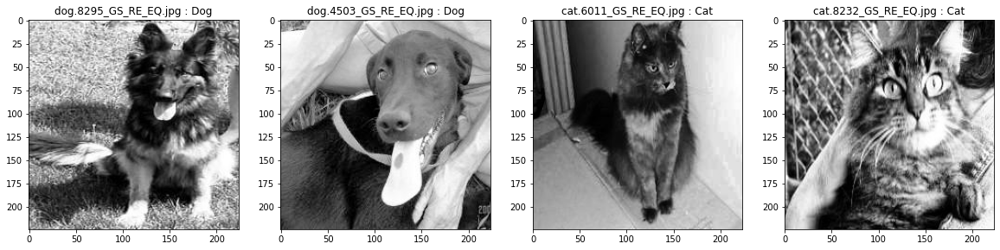

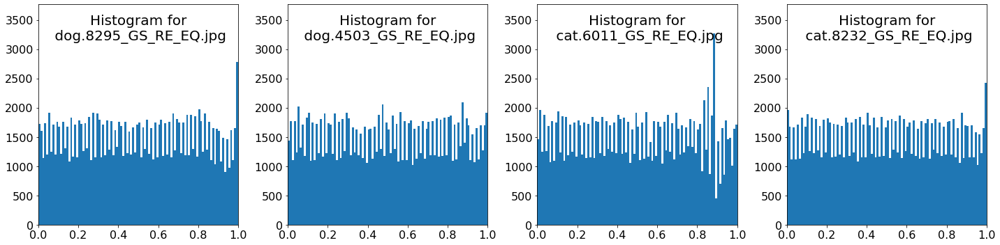

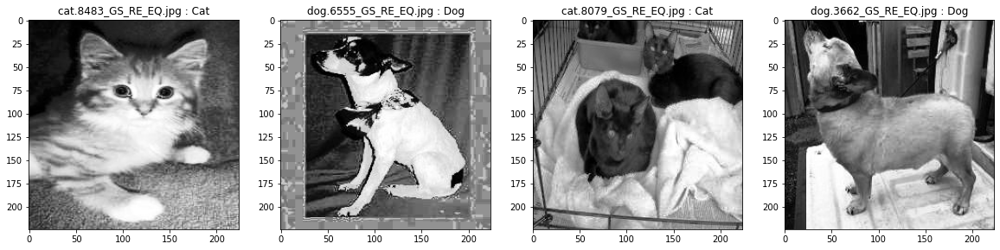

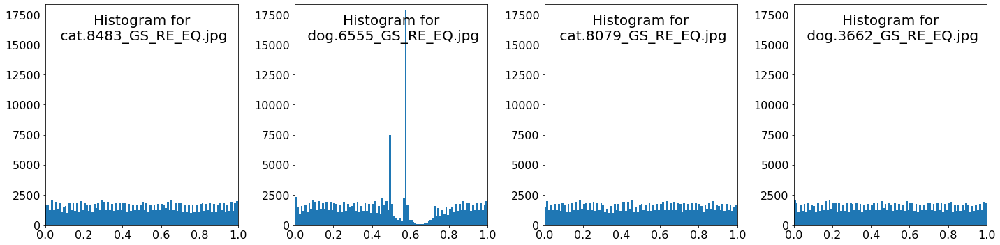

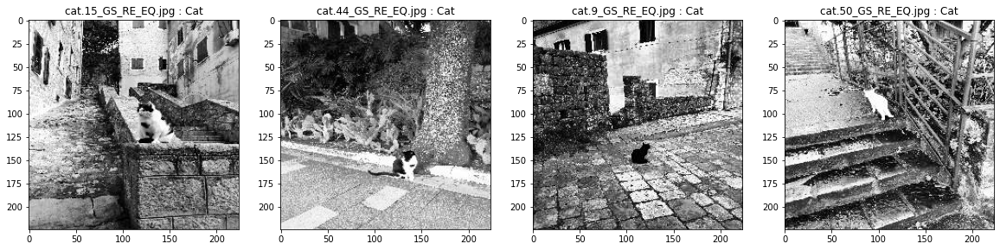

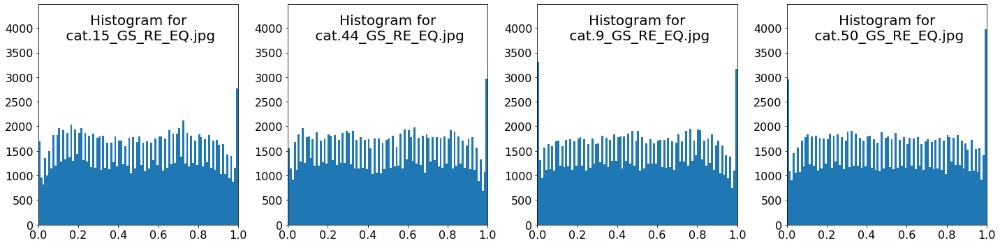

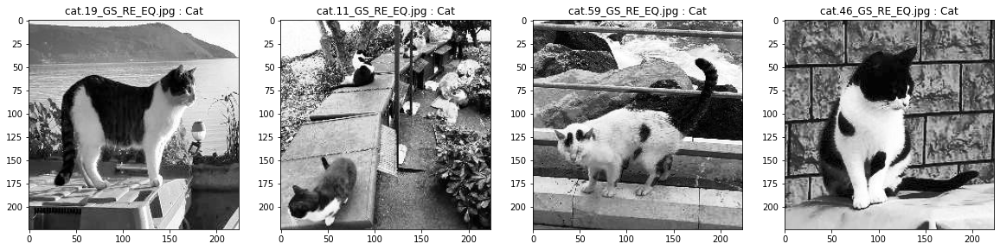

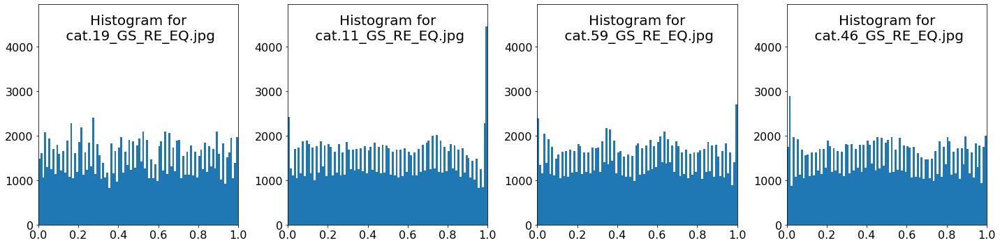

In [33]:
for dataSet in [dataSetTrain, dataSetTest, dataSetValidate, dataSetValidateCropped]:
    numImages = 4
    listImages = [randrange(0, dataSet.__len__()) for _ in range(numImages)]
    dataSet.plotImages(listImages)
    dataSet.plotHistogram(listImages)

In [34]:
# use the same conv layers and create the model
model = CNN(imageSize=MIN_SIZE_IMAGE,
              convLayers=[conv1, conv2, conv3, conv4, conv5], 
              fullConLayers=[1],              
              dropOut=0.5)
display(model)

Creating a CNN with the following architecture:

Convolution Layer: 0
Channels in: 3
Channels out: 32
Reading default parameters for max pooling
Size Image out Conv: (224, 224)
Size Image out MaxPool: (112, 112)

Convolution Layer: 1
Channels in: 32
Channels out: 64
Reading default parameters for max pooling
Size Image out Conv: (112, 112)
Size Image out MaxPool: (56, 56)

Convolution Layer: 2
Channels in: 64
Channels out: 128
Reading default parameters for max pooling
Size Image out Conv: (56, 56)
Size Image out MaxPool: (28, 28)

Convolution Layer: 3
Channels in: 128
Channels out: 256
Reading default parameters for max pooling
Size Image out Conv: (28, 28)
Size Image out MaxPool: (14, 14)

Convolution Layer: 4
Channels in: 256
Channels out: 512
Reading default parameters for max pooling
Size Image out Conv: (14, 14)
Size Image out MaxPool: (7, 7)

Fully connected layer: 0
Number of Neurons: 1

Setting criterion to BinaryCrossEntropyLoss!


CNN(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14)

Number of samples for train: 17650
Number of samples for test: 4395
Number of samples for vali: 61
Number of samples for valiCrop: 61

File checkpoint_GrayScaleImages_AllData_Equalized.pt or checkpoint_GrayScaleImages_AllData_Equalized_best.pt already exist.
ONLY RESUME TRAINING POSSIBLE!!!.


Loading checkpoint: checkpoint_GrayScaleImages_AllData_Equalized.pt
checkpoint[epoch]: 50

Loading checkpoint['accuracy_lists']
valiCrop : [0.21311475409836064, 0.08196721311475409, 0.22950819672131148, 0.39344262295081966, 0.36065573770491804, 0.4426229508196721, 0.7868852459016393, 0.45901639344262296, 0.21311475409836064, 0.3770491803278688, 0.3114754098360656, 0.5081967213114754, 0.39344262295081966, 0.47540983606557374, 0.2786885245901639, 0.4098360655737705, 0.5737704918032787, 0.4262295081967213, 0.21311475409836064, 0.36065573770491804, 0.39344262295081966, 0.47540983606557374, 0.29508196721311475, 0.4918032786885246, 0.4098360655737705, 0.5737704918032787, 0.4098360655737705, 0.295081967

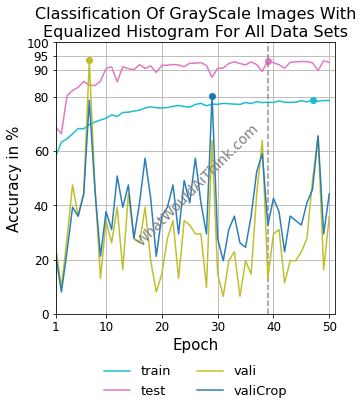

In [35]:
# Train the model
checkpoint="GrayScaleImages_AllData_Equalized"
tm = TrainingManager(lr=0.001, model=model, nameCheckpoint=checkpoint, 
                     batchSize=32, criterion=model.criterion,                     
                     datasets={"train": dataSetTrain, 
                      "test": dataSetTest,
                      "vali": dataSetValidate,
                      "valiCrop": dataSetValidateCropped},
                      title="Classification Of GrayScale Images With\nEqualized Histogram For All Data Sets")
n_epochs = 0
tm.resume(n_epochs)

### Test the trained CNN with the test set


Loading checkpoint: checkpoint_GrayScaleImages_AllData_Equalized_best.pt
Found    4098    true classified images in 4395 images.
Found    297     false classified images in 4395 images.

Confusion Matrix: [[2087  110]
 [ 187 2011]]
Found    2087    images classified as trueDog    in 4395 images.
Found    110     images classified as falseCat   in 4395 images.
Found    187     images classified as falseDog   in 4395 images.
Found    2011    images classified as trueCat    in 4395 images.


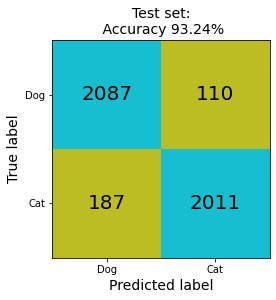

In [36]:
checkPointBest = f"checkpoint_{checkpoint}_best.pt"
validator = MyValidator(model, checkPointBest, dataSetTest, labelDic, "Test set")
validator.plotConfusionMatrix("Test set", f"CMatrixTestSetResults{checkpoint}")

### Validate the trained CNN with the validation sets


Loading checkpoint: checkpoint_GrayScaleImages_AllData_Equalized_best.pt
Found     8      true classified images in 61 images.
Found     53     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [53  8]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     53     images classified as falseDog   in 61 images.
Found     8      images classified as trueCat    in 61 images.


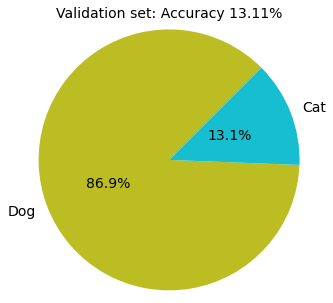

In [37]:
validator = MyValidator(model, checkPointBest, dataSetValidate, labelDic, "Validation set")
validator.plotPie("Validation set", f"PieChartValiSetResults{checkpoint}")


Loading checkpoint: checkpoint_GrayScaleImages_AllData_Equalized_best.pt
Found     20     true classified images in 61 images.
Found     41     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [41 20]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     41     images classified as falseDog   in 61 images.
Found     20     images classified as trueCat    in 61 images.


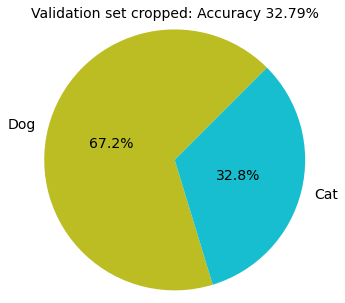

In [38]:
validator = MyValidator(model, checkPointBest, dataSetValidateCropped, labelDic, "Validation set cropped")
validator.plotPie("Validation set cropped", f"PieChartValiSetCroppedResults{checkpoint}")

### Plot some false and true classified images

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


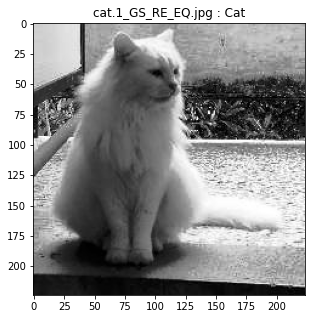

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


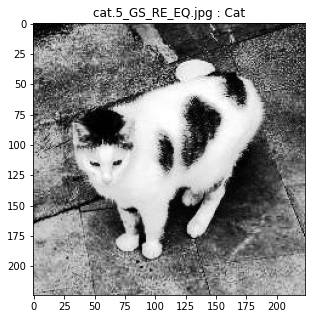

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


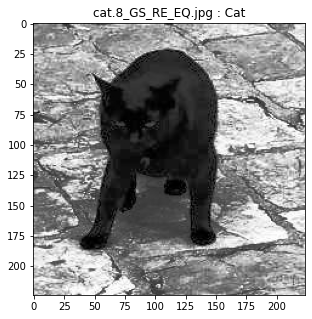

In [39]:
validator.plotClassifiedImages("False", 3)

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


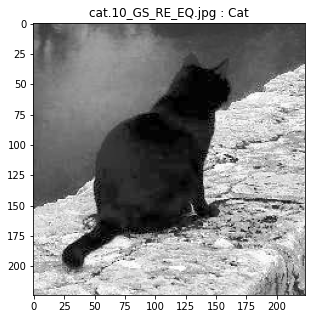

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


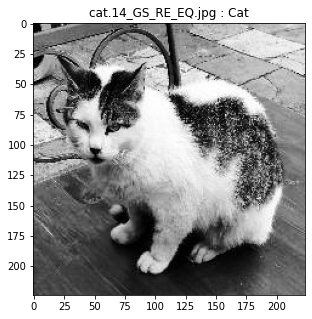

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


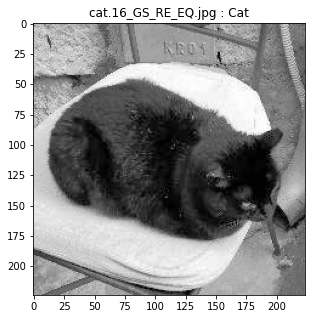

In [40]:
validator.plotClassifiedImages("True", 3)

<h1>8. Train the CNN with equalized training images and no batch normalisation for the convolution layers </h1>

### Update the DataFrames and DataSets and use equalized images only for the training images

In [41]:
df_train = readDataToDataFrame(os.path.join(pathDataSetEqualized224x224, "training_set"))
df_test     = readDataToDataFrame(os.path.join(pathDataSet224x224, "test_set"))
df_validate = readDataToDataFrame(os.path.join(pathDataSet224x224, "validate_set"))
df_validateCropped = readDataToDataFrame(os.path.join(pathDataSet224x224, "validate_set_cropped"))

dataSetTrain = Data(df_train)
dataSetTest = Data(df_test)
dataSetValidate = Data(df_validate)
dataSetValidateCropped = Data(df_validateCropped)

Reading files from folder: datasets_gray_equalized224x224/training_set/cats
Reading files from folder: datasets_gray_equalized224x224/training_set/dogs
Reading files from folder: datasets_gray224x224/test_set/cats
Reading files from folder: datasets_gray224x224/test_set/dogs
Reading files from folder: datasets_gray224x224/validate_set/cats
Reading files from folder: datasets_gray224x224/validate_set_cropped/cats


### Plot images and histograms for all DataSets to check that only the training images are equalized

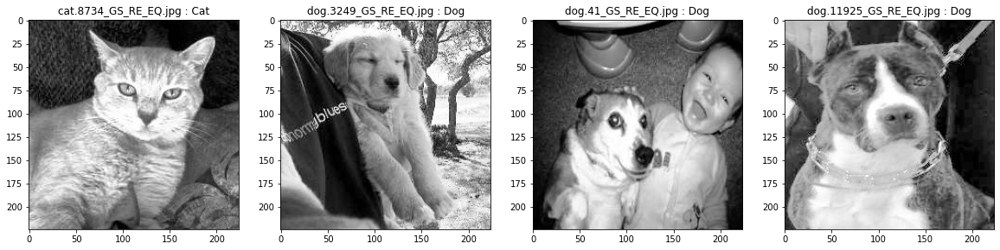

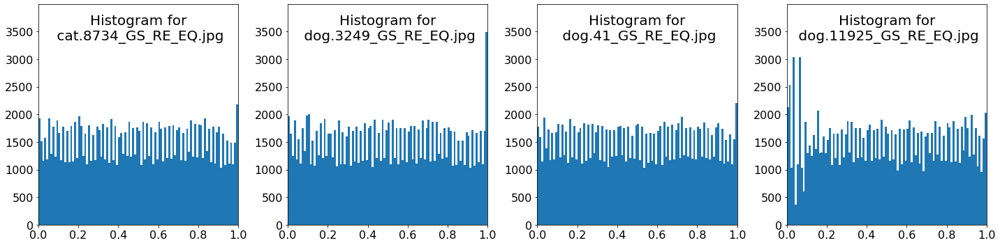

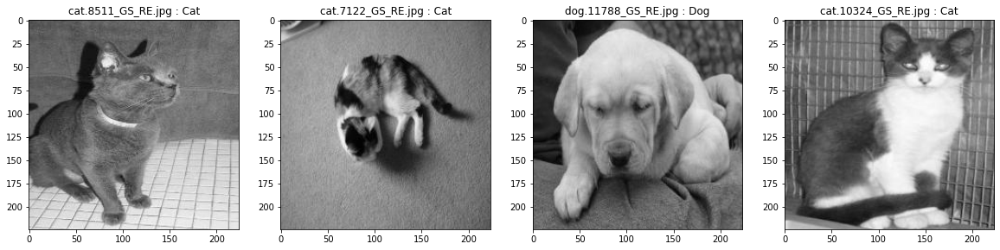

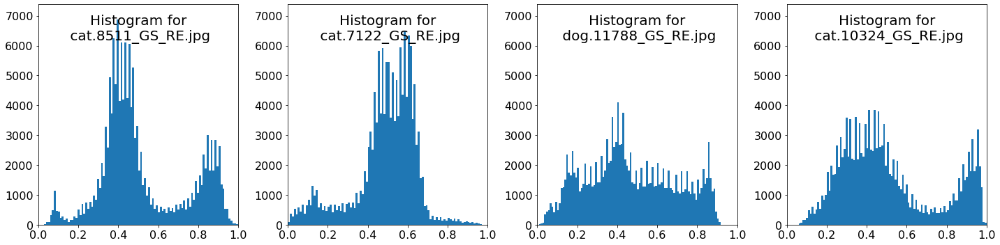

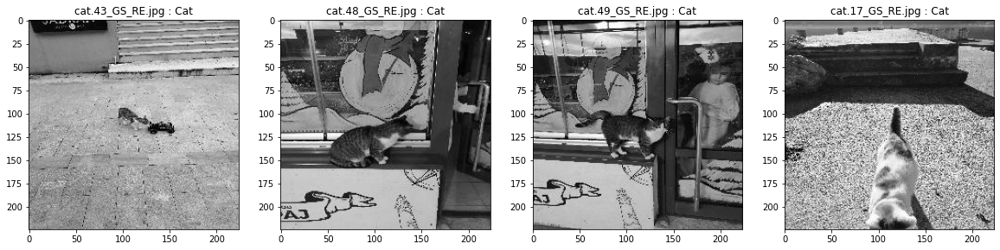

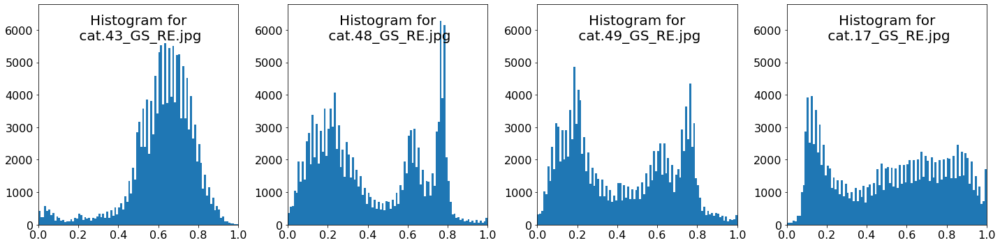

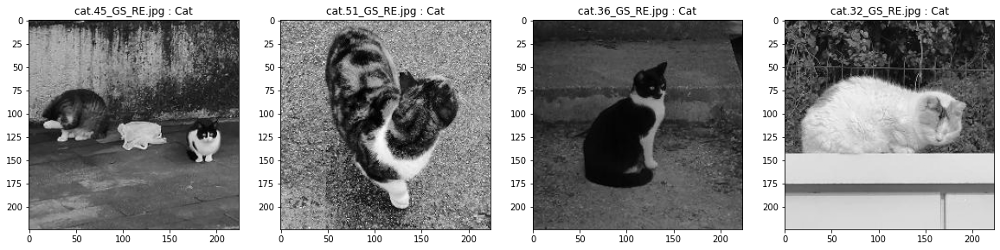

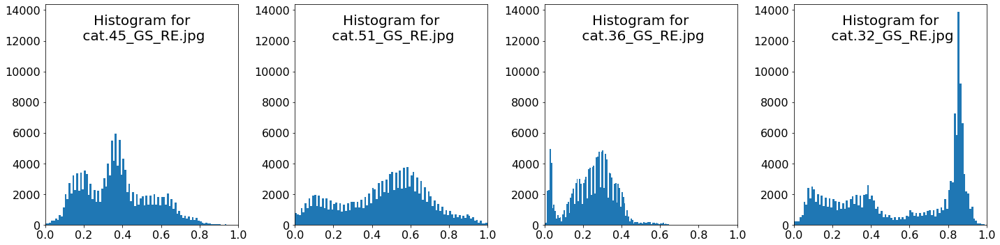

In [42]:
for dataSet in [dataSetTrain, dataSetTest, dataSetValidate, dataSetValidateCropped]:
    numImages = 4
    listImages = [randrange(0, dataSet.__len__()) for _ in range(numImages)]
    dataSet.plotImages(listImages)
    dataSet.plotHistogram(listImages)

In [43]:
# use the same conv layers and create the model
# create the model without batch normalisation for the convolution layers
model = CNN(imageSize=MIN_SIZE_IMAGE,
            convLayers=[conv1, conv2, conv3, conv4, conv5], 
            fullConLayers=[1],              
            dropOut=0.5,
            batchNormConv=False,
            batchNormFullCon=True)

printNumOfLearnableWeights(model)
display(model)

Creating a CNN with the following architecture:

Convolution Layer: 0
Channels in: 3
Channels out: 32
Reading default parameters for max pooling
Size Image out Conv: (224, 224)
Size Image out MaxPool: (112, 112)

Convolution Layer: 1
Channels in: 32
Channels out: 64
Reading default parameters for max pooling
Size Image out Conv: (112, 112)
Size Image out MaxPool: (56, 56)

Convolution Layer: 2
Channels in: 64
Channels out: 128
Reading default parameters for max pooling
Size Image out Conv: (56, 56)
Size Image out MaxPool: (28, 28)

Convolution Layer: 3
Channels in: 128
Channels out: 256
Reading default parameters for max pooling
Size Image out Conv: (28, 28)
Size Image out MaxPool: (14, 14)

Convolution Layer: 4
Channels in: 256
Channels out: 512
Reading default parameters for max pooling
Size Image out Conv: (14, 14)
Size Image out MaxPool: (7, 7)

Fully connected layer: 0
Number of Neurons: 1

Setting criterion to BinaryCrossEntropyLoss!
Number of trainable weights: 4380483


CNN(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (9): Conv2d(128, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(256, 512, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=25088, out_featu

Number of samples for train: 17650
Number of samples for test: 4395
Number of samples for vali: 61
Number of samples for valiCrop: 61

File checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConv.pt or checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConv_best.pt already exist.
ONLY RESUME TRAINING POSSIBLE!!!.


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConv.pt
checkpoint[epoch]: 51

Loading checkpoint['accuracy_lists']
valiCrop : [0.39344262295081966, 0.14754098360655737, 0.11475409836065574, 0.21311475409836064, 0.29508196721311475, 0.4098360655737705, 0.32786885245901637, 0.3114754098360656, 0.36065573770491804, 0.39344262295081966, 0.32786885245901637, 0.4426229508196721, 0.3114754098360656, 0.45901639344262296, 0.4426229508196721, 0.47540983606557374, 0.2459016393442623, 0.19672131147540983, 0.32786885245901637, 0.3442622950819672, 0.29508196721311475, 0.26229508196721313, 0.5245901639344263, 0.5081967213114754, 0.50819

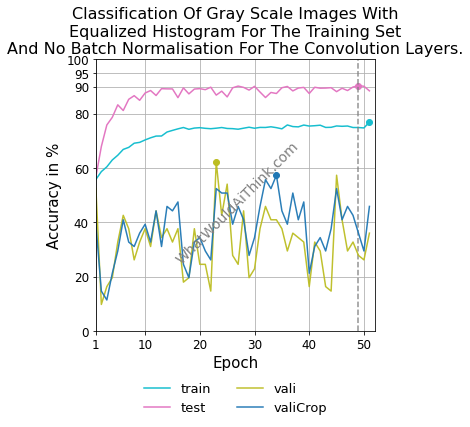

In [44]:
# Train the model    
checkpoint="GrayScaleImages_TrainingData_Equalized_NoBatchNormConv"
tm = TrainingManager(lr=0.001, model=model, nameCheckpoint=checkpoint, 
                     batchSize=32, criterion=model.criterion,                     
                     datasets={"train": dataSetTrain, 
                      "test": dataSetTest,
                      "vali": dataSetValidate,
                      "valiCrop": dataSetValidateCropped},
                      title="Classification Of Gray Scale Images With\nEqualized Histogram For The Training Set\nAnd No Batch Normalisation For The Convolution Layers.")
n_epochs = 0
tm.resume(n_epochs)

### Test the trained CNN with the test set


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConv_best.pt
Found    3970    true classified images in 4395 images.
Found    425     false classified images in 4395 images.

Confusion Matrix: [[1982  215]
 [ 210 1988]]
Found    1982    images classified as trueDog    in 4395 images.
Found    215     images classified as falseCat   in 4395 images.
Found    210     images classified as falseDog   in 4395 images.
Found    1988    images classified as trueCat    in 4395 images.


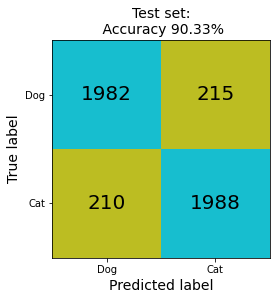

In [45]:
checkPointBest = f"checkpoint_{checkpoint}_best.pt"
validator = MyValidator(model, checkPointBest, dataSetTest, labelDic, "Test set")
validator.plotConfusionMatrix("Test set", f"CMatrixTestSetResults{checkpoint}")

### Validate the trained CNN with the validation sets


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConv_best.pt
Found     17     true classified images in 61 images.
Found     44     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [44 17]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     44     images classified as falseDog   in 61 images.
Found     17     images classified as trueCat    in 61 images.


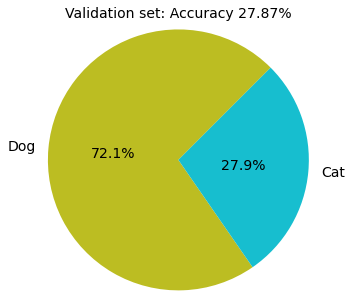

In [46]:
validator = MyValidator(model, checkPointBest, dataSetValidate, labelDic, "Validation set")
validator.plotPie("Validation set", f"PieChartValiSetResults{checkpoint}")


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConv_best.pt
Found     22     true classified images in 61 images.
Found     39     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [39 22]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     39     images classified as falseDog   in 61 images.
Found     22     images classified as trueCat    in 61 images.


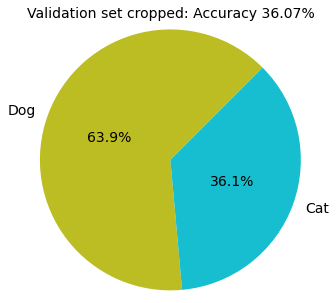

In [47]:
validator = MyValidator(model, checkPointBest, dataSetValidateCropped, labelDic, "Validation set cropped")
validator.plotPie("Validation set cropped", f"PieChartValiSetCroppedResults{checkpoint}")

### Plot some false and true classified images

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


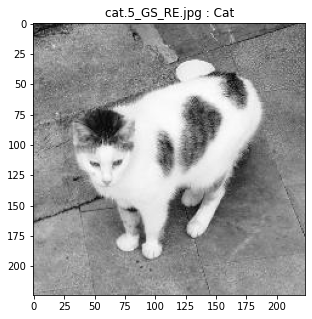

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


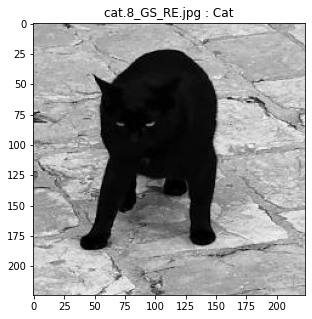

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


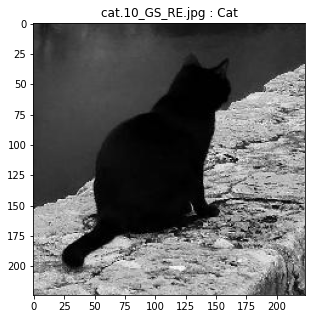

In [48]:
validator.plotClassifiedImages("False", 3)

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


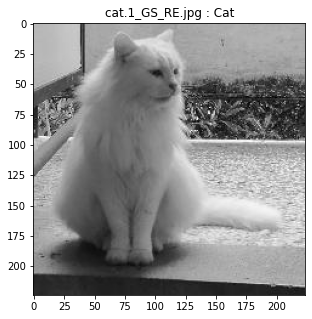

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


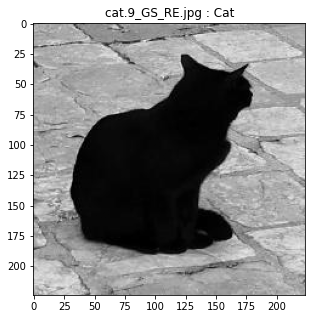

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


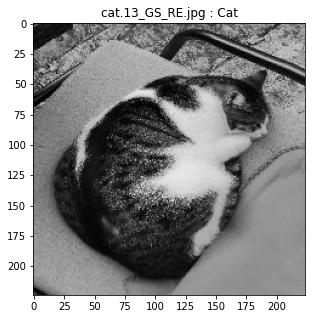

In [49]:
validator.plotClassifiedImages("True", 3)

<h1>9. Train the CNN with equalized training images and no batch normalisation for the convolution layers and the fully connected layer</h1>

Creating a CNN with the following architecture:

Convolution Layer: 0
Channels in: 3
Channels out: 32
Reading default parameters for max pooling
Size Image out Conv: (224, 224)
Size Image out MaxPool: (112, 112)

Convolution Layer: 1
Channels in: 32
Channels out: 64
Reading default parameters for max pooling
Size Image out Conv: (112, 112)
Size Image out MaxPool: (56, 56)

Convolution Layer: 2
Channels in: 64
Channels out: 128
Reading default parameters for max pooling
Size Image out Conv: (56, 56)
Size Image out MaxPool: (28, 28)

Convolution Layer: 3
Channels in: 128
Channels out: 256
Reading default parameters for max pooling
Size Image out Conv: (28, 28)
Size Image out MaxPool: (14, 14)

Convolution Layer: 4
Channels in: 256
Channels out: 512
Reading default parameters for max pooling
Size Image out Conv: (14, 14)
Size Image out MaxPool: (7, 7)

Fully connected layer: 0
Number of Neurons: 1

Setting criterion to BinaryCrossEntropyLoss!
Number of trainable weights: 4380483


CNN(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (9): Conv2d(128, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(256, 512, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=25088, out_featu

Number of samples for train: 17650
Number of samples for test: 4395
Number of samples for vali: 61
Number of samples for valiCrop: 61

File checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConvAndFully.pt or checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConvAndFully_best.pt already exist.
ONLY RESUME TRAINING POSSIBLE!!!.


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConvAndFully.pt
checkpoint[epoch]: 50

Loading checkpoint['accuracy_lists']
valiCrop : [0.4098360655737705, 0.5737704918032787, 0.45901639344262296, 0.39344262295081966, 0.3114754098360656, 0.4918032786885246, 0.3770491803278688, 0.6065573770491803, 0.4262295081967213, 0.36065573770491804, 0.4426229508196721, 0.36065573770491804, 0.4098360655737705, 0.45901639344262296, 0.4426229508196721, 0.5245901639344263, 0.3442622950819672, 0.4262295081967213, 0.4098360655737705, 0.4426229508196721, 0.45901639344262296, 0.47540983606557374, 0.5409836065573771, 0.442622950

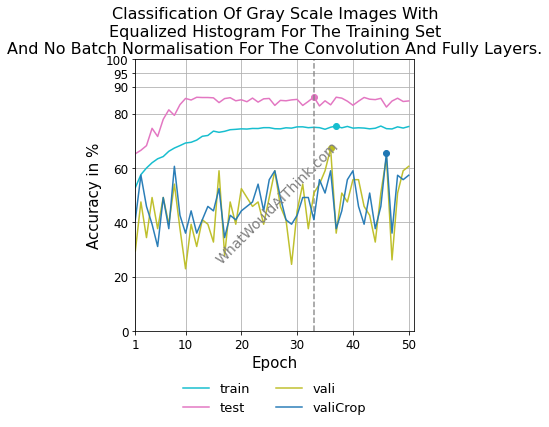

In [50]:
# use the same conv layers and create the model
# create the model without batch normalisation for the
# convolution layers and the fully connected layer
model = CNN(imageSize=MIN_SIZE_IMAGE,
            convLayers=[conv1, conv2, conv3, conv4, conv5], 
            fullConLayers=[1],              
            dropOut=0.5,
            batchNormConv=False,
            batchNormFullCon=True)

printNumOfLearnableWeights(model)
display(model)

# Train the model
checkpoint="GrayScaleImages_TrainingData_Equalized_NoBatchNormConvAndFully"
tm = TrainingManager(lr=0.001, model=model, nameCheckpoint=checkpoint,
                     batchSize=32, criterion=model.criterion,                     
                     datasets={"train": dataSetTrain, 
                      "test": dataSetTest,
                      "vali": dataSetValidate,
                      "valiCrop": dataSetValidateCropped},
                      title="Classification Of Gray Scale Images With\nEqualized Histogram For The Training Set\nAnd No Batch Normalisation For The Convolution And Fully Layers.")
n_epochs = 0
tm.resume(n_epochs)

### Test the trained CNN with the test set


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConvAndFully_best.pt
Found    3786    true classified images in 4395 images.
Found    609     false classified images in 4395 images.

Confusion Matrix: [[1851  346]
 [ 263 1935]]
Found    1851    images classified as trueDog    in 4395 images.
Found    346     images classified as falseCat   in 4395 images.
Found    263     images classified as falseDog   in 4395 images.
Found    1935    images classified as trueCat    in 4395 images.


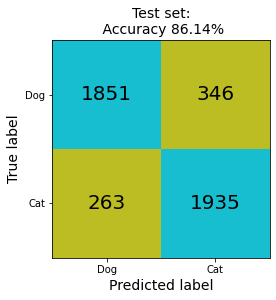

In [51]:
checkPointBest = f"checkpoint_{checkpoint}_best.pt"
validator = MyValidator(model, checkPointBest, dataSetTest, labelDic, "Test set")
validator.plotConfusionMatrix("Test set", f"CMatrixTestSetResults{checkpoint}")

### Validate the trained CNN with the validation sets


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConvAndFully_best.pt
Found     31     true classified images in 61 images.
Found     30     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [30 31]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     30     images classified as falseDog   in 61 images.
Found     31     images classified as trueCat    in 61 images.


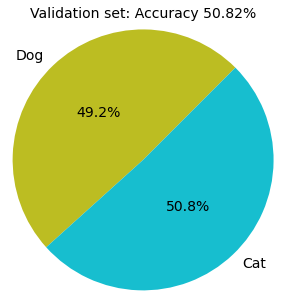

In [52]:
validator = MyValidator(model, checkPointBest, dataSetValidate, labelDic, "Validation set")
validator.plotPie("Validation set", f"PieChartValiSetResults{checkpoint}")


Loading checkpoint: checkpoint_GrayScaleImages_TrainingData_Equalized_NoBatchNormConvAndFully_best.pt
Found     25     true classified images in 61 images.
Found     36     false classified images in 61 images.

Confusion Matrix: [[ 0  0]
 [36 25]]
Found     0      images classified as trueDog    in 61 images.
Found     0      images classified as falseCat   in 61 images.
Found     36     images classified as falseDog   in 61 images.
Found     25     images classified as trueCat    in 61 images.


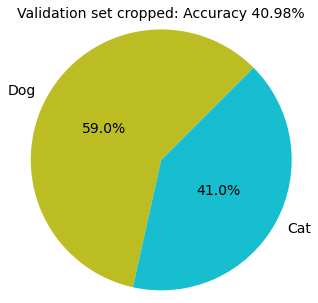

In [53]:
validator = MyValidator(model, checkPointBest, dataSetValidateCropped, labelDic, "Validation set cropped")
validator.plotPie("Validation set cropped", f"PieChartValiSetCroppedResults{checkpoint}")

### Plot some false and true classified images

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


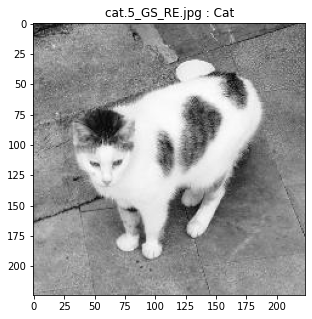

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


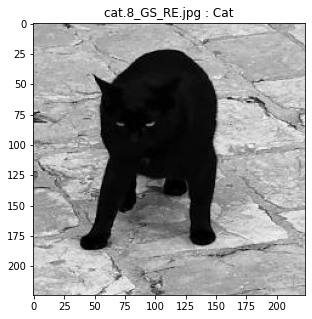

Real: Cat -- Classified: Dog
Label: 1 -- Yhat: 0


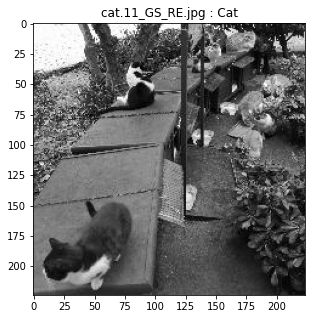

In [54]:
validator.plotClassifiedImages("False", 3)

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


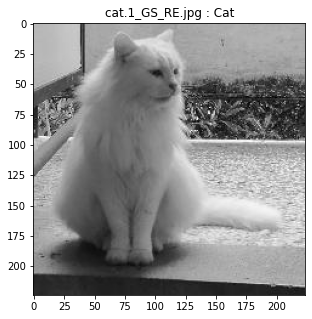

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


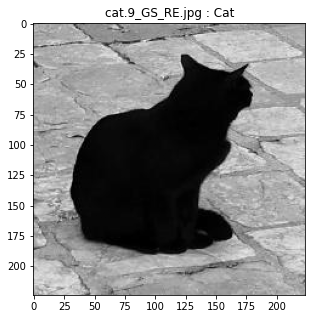

Real: Cat -- Classified: Cat
Label: 1 -- Yhat: 1


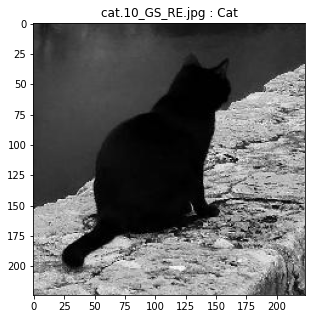

In [55]:
validator.plotClassifiedImages("True", 3)